## Santander Customer Transaction Prediction


### Project Overview
A lot of companies look for ways to help their customers understand their financial health and identify which products and services might help them achieve their monetary goals.

Santander released a competition on kaggle this February, they invited Kagglers to help them identify which customers will make a specific transaction in the future, irrespective of the amount of money transacted.  

Link of the competition: https://www.kaggle.com/c/santander-customer-transaction-prediction

### Dataset Overview:
The data provided for this competition has the same structure as the real data Santander use to solve this problem.

Santander provided two datasets: train.csv and test.csv

In train.csv, the data consists of 200000 rows and 202 columns. The first column is ID_code, the second column is target. The other columns are features, named from "var_0" to "var_199".

In test.csv, the data consists of 200000 rows and 201 columns. The first column is ID_code, other columns are features, which are the same as train.csv.

### Import Libraries

In [3]:
import pandas as pd
import numpy as np
from pandas import DataFrame
from pandas import Series 
import seaborn as sns
import matplotlib
from matplotlib import font_manager
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import rc
from scipy.stats import norm
import scipy.stats as stats
import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn import preprocessing
from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier
import sklearn.metrics as metrics
from sklearn.linear_model import LogisticRegression
from sklearn import linear_model
from sklearn.linear_model import ElasticNet
from sklearn.datasets import make_regression
from sklearn.model_selection import StratifiedKFold,KFold
import lightgbm as lgb
from hyperopt import hp,tpe,Trials,fmin, STATUS_OK
from hyperopt.pyll.stochastic import sample
from timeit import default_timer as timer
from hyperopt import hp
from hyperopt import Trials
import csv

### Load Data

In [2]:
train_df = pd.read_csv('santander-customer-transaction-prediction/train.csv', index_col=0)
test_df = pd.read_csv('santander-customer-transaction-prediction/test.csv', index_col=0)
submission = pd.read_csv('santander-customer-transaction-prediction/sample_submission.csv', index_col=0)

In [4]:
X = train_df.iloc[:,1:]
y = train_df.target

In [15]:
X.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
ID_code,,,,,,,,,,,,,,,,,,,,,
train_0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
train_1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
train_2,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,5.9525,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
train_3,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,8.2450,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
train_4,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,7.6784,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [16]:
y.head()

ID_code
train_0    0
train_1    0
train_2    0
train_3    0
train_4    0
Name: target, dtype: int64

In [17]:
test_df.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
ID_code,,,,,,,,,,,,,,,,,,,,,
test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,8.8100,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,5.9739,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
test_2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,8.3442,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
test_3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,7.4578,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
test_4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,7.1437,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846


### EDA

In [18]:
train_df.shape

(200000, 201)

In [19]:
test_df.shape

(200000, 200)

#### describe train and test
Observe mean, std, min, max for train_df and test_df. Comapre train_describe with test_describe we found that for most features, they have similar mean, std, min, max values.

In [7]:
train_describe = train_df.describe()
train_describe

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [8]:
print('train_describe max is : ', train_describe.loc['max'].max())
print('train_describe min is : ', train_describe.loc['min'].min())
print('train_describe max std is : ', train_describe.loc['std'].max())
print('train_describe min std is : ', train_describe.loc['std'].min())

train_describe max is :  74.0321
train_describe min is :  -90.2525
train_describe max std is :  21.404911544677045
train_describe min std is :  0.007186267883143507


In [9]:
test_describe = test_df.describe()
test_describe 

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.658737,-1.624244,10.707452,6.788214,11.076399,-5.050558,5.415164,16.529143,0.277135,7.569407,...,3.189766,7.458269,1.925944,3.322016,17.996967,-0.133657,2.290899,8.912428,15.869184,-3.246342
std,3.036716,4.040509,2.633888,2.052724,1.616456,7.869293,0.864686,3.424482,3.333375,1.231865,...,4.551239,3.025189,1.479966,3.995599,3.140652,1.429678,5.446346,0.920904,3.008717,10.398589
min,0.188700,-15.043400,2.355200,-0.022400,5.484400,-27.767000,2.216400,5.713700,-9.956000,4.243300,...,-14.093300,-2.407000,-3.340900,-11.413100,9.382800,-4.911900,-13.944200,6.169600,6.584000,-39.457800
25%,8.442975,-4.700125,8.735600,5.230500,9.891075,-11.201400,4.772600,13.933900,-2.303900,6.623800,...,-0.095000,5.166500,0.882975,0.587600,15.634775,-1.160700,-1.948600,8.260075,13.847275,-11.124000
50%,10.513800,-1.590500,10.560700,6.822350,11.099750,-4.834100,5.391600,16.422700,0.372000,7.632000,...,3.162400,7.379000,1.892600,3.428500,17.977600,-0.162000,2.403600,8.892800,15.943400,-2.725950
75%,12.739600,1.343400,12.495025,8.327600,12.253400,0.942575,6.005800,19.094550,2.930025,8.584825,...,6.336475,9.531100,2.956000,6.174200,20.391725,0.837900,6.519800,9.595900,18.045200,4.935400
max,22.323400,9.385100,18.714100,13.142000,16.037100,17.253700,8.302500,28.292800,9.665500,11.003600,...,20.359000,16.716500,8.005000,17.632600,27.947800,4.545400,15.920700,12.275800,26.538400,27.907400


In [10]:
print('test_describe max is : ', test_describe.loc['max'].max())
print('test_describe min is : ', test_describe.loc['min'].min())
print('test_describe max std is : ', test_describe.loc['std'].max())
print('test_describe min std is : ', test_describe.loc['std'].min())

test_describe max is :  84.6841
test_describe min is :  -83.6921
test_describe max std is :  21.402708162073154
test_describe min std is :  0.007193903387712463


#### data type
Check if there is any column that does not have numerical values.
From the result we can see data type for all features in train and test are numerical

In [20]:
#check if there is any column that does not have numerical values
train_num_cols = train_df.select_dtypes(include=['float64', 'int64']).columns.values 
print(train_num_cols)
train_num_cols.shape

['target' 'var_0' 'var_1' 'var_2' 'var_3' 'var_4' 'var_5' 'var_6' 'var_7'
 'var_8' 'var_9' 'var_10' 'var_11' 'var_12' 'var_13' 'var_14' 'var_15'
 'var_16' 'var_17' 'var_18' 'var_19' 'var_20' 'var_21' 'var_22' 'var_23'
 'var_24' 'var_25' 'var_26' 'var_27' 'var_28' 'var_29' 'var_30' 'var_31'
 'var_32' 'var_33' 'var_34' 'var_35' 'var_36' 'var_37' 'var_38' 'var_39'
 'var_40' 'var_41' 'var_42' 'var_43' 'var_44' 'var_45' 'var_46' 'var_47'
 'var_48' 'var_49' 'var_50' 'var_51' 'var_52' 'var_53' 'var_54' 'var_55'
 'var_56' 'var_57' 'var_58' 'var_59' 'var_60' 'var_61' 'var_62' 'var_63'
 'var_64' 'var_65' 'var_66' 'var_67' 'var_68' 'var_69' 'var_70' 'var_71'
 'var_72' 'var_73' 'var_74' 'var_75' 'var_76' 'var_77' 'var_78' 'var_79'
 'var_80' 'var_81' 'var_82' 'var_83' 'var_84' 'var_85' 'var_86' 'var_87'
 'var_88' 'var_89' 'var_90' 'var_91' 'var_92' 'var_93' 'var_94' 'var_95'
 'var_96' 'var_97' 'var_98' 'var_99' 'var_100' 'var_101' 'var_102'
 'var_103' 'var_104' 'var_105' 'var_106' 'var_107' 'var_10

(201,)

In [21]:
#check if there is any column that does not have numerical values
test_num_cols = test_df.select_dtypes(include=['float64', 'int64']).columns.values 
print(test_num_cols)
test_num_cols.shape

['var_0' 'var_1' 'var_2' 'var_3' 'var_4' 'var_5' 'var_6' 'var_7' 'var_8'
 'var_9' 'var_10' 'var_11' 'var_12' 'var_13' 'var_14' 'var_15' 'var_16'
 'var_17' 'var_18' 'var_19' 'var_20' 'var_21' 'var_22' 'var_23' 'var_24'
 'var_25' 'var_26' 'var_27' 'var_28' 'var_29' 'var_30' 'var_31' 'var_32'
 'var_33' 'var_34' 'var_35' 'var_36' 'var_37' 'var_38' 'var_39' 'var_40'
 'var_41' 'var_42' 'var_43' 'var_44' 'var_45' 'var_46' 'var_47' 'var_48'
 'var_49' 'var_50' 'var_51' 'var_52' 'var_53' 'var_54' 'var_55' 'var_56'
 'var_57' 'var_58' 'var_59' 'var_60' 'var_61' 'var_62' 'var_63' 'var_64'
 'var_65' 'var_66' 'var_67' 'var_68' 'var_69' 'var_70' 'var_71' 'var_72'
 'var_73' 'var_74' 'var_75' 'var_76' 'var_77' 'var_78' 'var_79' 'var_80'
 'var_81' 'var_82' 'var_83' 'var_84' 'var_85' 'var_86' 'var_87' 'var_88'
 'var_89' 'var_90' 'var_91' 'var_92' 'var_93' 'var_94' 'var_95' 'var_96'
 'var_97' 'var_98' 'var_99' 'var_100' 'var_101' 'var_102' 'var_103'
 'var_104' 'var_105' 'var_106' 'var_107' 'var_108' 'var_1

(200,)

#### missing value
Check if there is any missing value. From the result we can see there is no missing value in both train and test.

In [12]:
#check if there is any missing value in train
train_NA = train_df.isna().sum()
train_NA1 = train_NA[train_NA>0] 
train_NA1

Series([], dtype: int64)

In [13]:
#check if there is any missing value in test
test_NA = test_df.isna().sum()
test_NA1 = test_NA[test_NA>0] 
test_NA1

Series([], dtype: int64)

Check the distribution of each feature for both train and test. From the KDE(Kernel density estimation) plot we can tell the distribution of each feature for both train and test are very similar. This makes me confident about the accuracy of the model in the future.

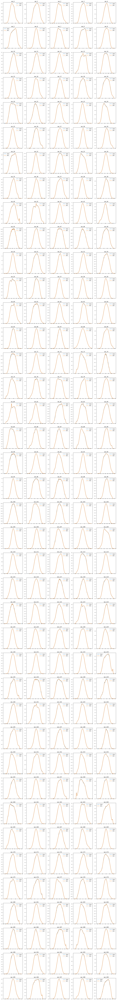

In [52]:
# make KDE plots to see the distribution of each feature for both train and test
# video about KDE plot https://www.youtube.com/watch?v=R6_LR-f6Tt4
# code is based upon
# https://seaborn.pydata.org/tutorial/distributions.html
nrows, ncols = 40, 5
plt.figure(figsize=(20,180))
for i in range(1, 201):
    plt.subplot(nrows, ncols ,i)
    sns.kdeplot(train_df.iloc[:,i], bw=0.5,label="train")
    sns.kdeplot(test_df.iloc[:,i-1], bw=0.5,label="test")
    plt.title(train_df.columns.values[i])
    locs, labels = plt.xticks()
    plt.tick_params(axis='x', which='major', labelsize=6, pad=-6)
    plt.tick_params(axis='y', which='major', labelsize=6)
plt.show();


#### target
Observe the target value. From the result and plot we can see that the target is not balanced. Only about 10% of the target has a value of 1, the other are all 0. That is to say, only 10% of the customer will make next transaction.

In [16]:
train_df.target.value_counts()

0    179902
1     20098
Name: target, dtype: int64

0    179902
1     20098
Name: target, dtype: int64

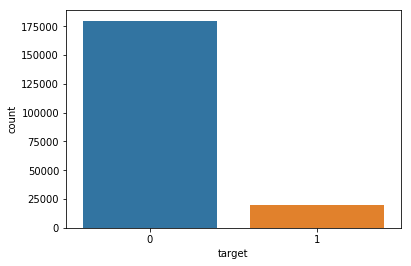

In [17]:
# check if target is bias
sns.countplot(x="target", data=pd.DataFrame(train_df, columns=["target"]))
pd.Series(train_df.target).value_counts()

#### Correlation

Plot scatterplot matrix first to see the correlation of first ten features. From the pairplot we can see that there is no correlation of the first ten features.

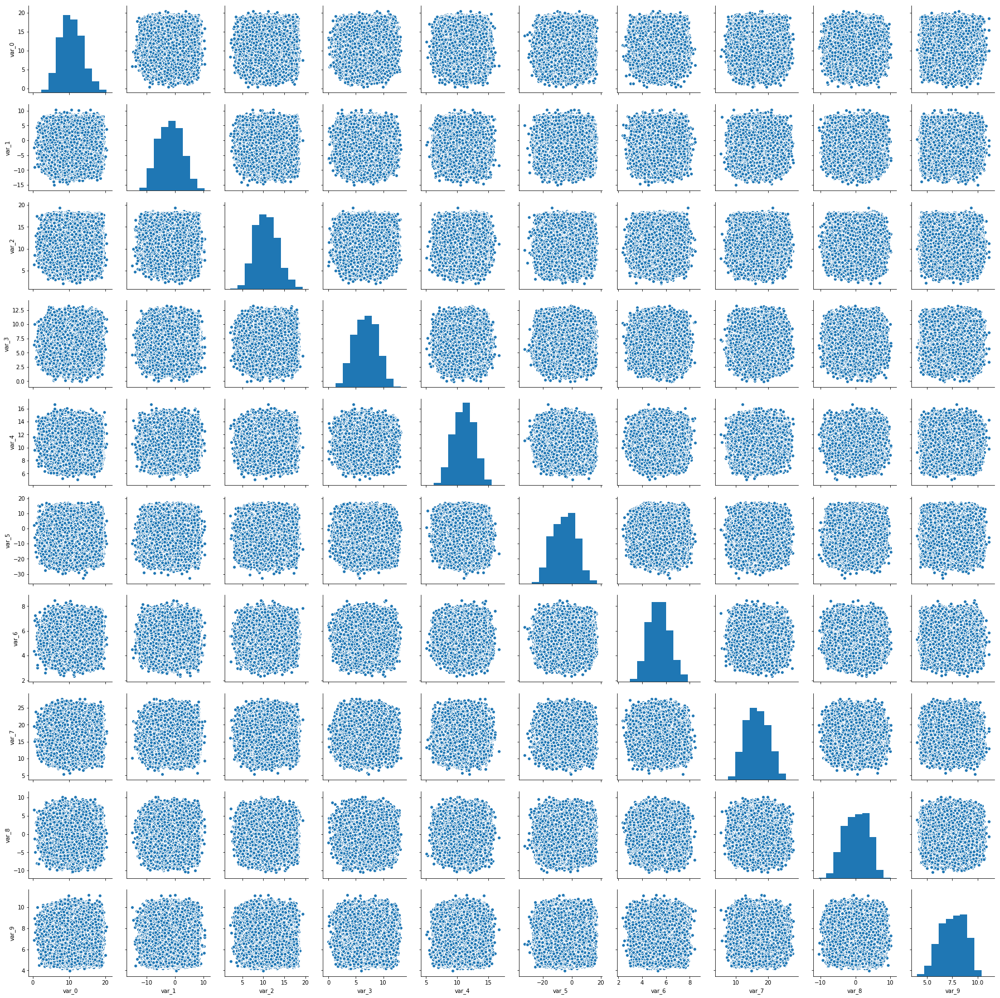

In [227]:
import seaborn as sns
sns.pairplot(train_df.iloc[:,1:11])

Observe the correlation of all features, including target

In [19]:
train_df_corr = train_df.corr()

From the following plot we can roughly tell that there is no correlation beween any features.

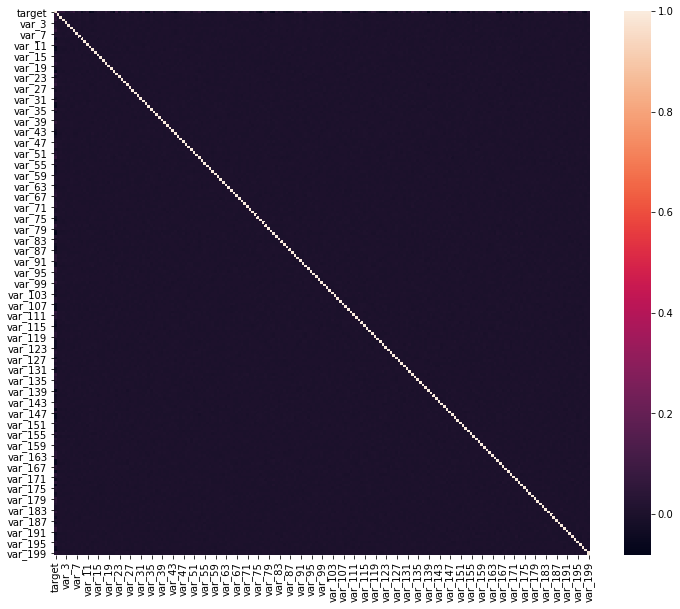

In [20]:
#check correlation for each column 
plt.figure(figsize=(12,10))
sns.heatmap(train_df_corr)

Print out 30 featrues who have the maximum correlated value with target. We can see var_81 has the maximum correlation value with target, and it is only 0.080917. So no feature is correlated with target.

In [21]:
#check the correlation between target and all other features
train_df_corr_target = train_df_corr.iloc[:,:1]
train_df_corr_target

,target
target,1.000000
var_0,0.052390
var_1,0.050343
var_2,0.055870
var_3,0.011055
var_4,0.010915
var_5,0.030979
var_6,0.066731
var_7,-0.003025
var_8,0.019584


In [23]:
train_df_corr_target.abs().sort_values(by = 'target').tail(31)

,target
var_44,0.049039
var_40,0.049530
var_109,0.049926
var_179,0.050002
var_115,0.050174
var_1,0.050343
var_0,0.052390
var_34,0.052692
var_198,0.053000
var_133,0.054548


Print out 15 feature pairs with the maximum correlated value. We can see var_81 and var_165 has the maximum correlation value, and it is only 0.009714. So no feature pair is correlated with each other.

In [24]:
#code is based upon
#https://stackoverflow.com/questions/45718094/how-can-i-retrieve-the-k-highest-values-in-a-data-frame-in-pandas
train_df_corr1 = train_df_corr.iloc[1:,1:].stack().nlargest(230)
train_df_corr1 = train_df_corr1[-30:].drop_duplicates()
train_df_corr1

var_81   var_165    0.009714
         var_174    0.009490
var_183  var_189    0.009359
var_146  var_169    0.009071
var_122  var_132    0.008956
var_81   var_172    0.008936
var_12   var_146    0.008591
var_172  var_193    0.008163
var_6    var_157    0.008076
var_167  var_173    0.008045
var_26   var_48     0.007992
var_12   var_166    0.007929
var_121  var_149    0.007884
var_13   var_44     0.007843
var_137  var_180    0.007812
dtype: float64

Do the same thing for test_df. We can see no feature pair is correlated with each other.

In [26]:
#check the correlation between target and all other features
test_df_corr = test_df.corr()
#test_df_corr = test_df_corr.iloc[:,:1]
test_df_corr

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
var_0,1.000000,0.004234,0.002625,0.000847,-0.004252,0.002274,0.001930,-0.004654,-0.003669,0.001427,...,0.002662,0.001151,0.001102,0.002756,-0.003509,0.001446,-0.000754,-0.000382,-0.004068,0.001248
var_1,0.004234,1.000000,0.002912,-0.002148,0.000716,0.001393,0.003567,0.003024,0.000778,-0.002643,...,0.002032,0.003477,-0.003454,0.000345,0.000126,0.001339,-0.001627,-0.002839,-0.003024,0.001861
var_2,0.002625,0.002912,1.000000,-0.005882,0.003657,0.000283,-0.001141,-0.000273,0.001231,0.000041,...,-0.001765,0.001144,-0.005496,0.002027,-0.002396,0.001333,-0.002400,-0.002726,-0.001537,0.000229
var_3,0.000847,-0.002148,-0.005882,1.000000,-0.000959,0.001644,-0.003074,0.001945,-0.001443,-0.001291,...,-0.001630,0.002119,0.001269,-0.006136,0.000289,0.001601,0.003177,0.002780,-0.002625,-0.003034
var_4,-0.004252,0.000716,0.003657,-0.000959,1.000000,0.004822,-0.003284,-0.000167,0.003138,0.000093,...,-0.003106,0.002473,-0.000734,-0.000754,-0.000427,0.003046,-0.001317,0.000425,-0.002146,0.000401
var_5,0.002274,0.001393,0.000283,0.001644,0.004822,1.000000,-0.003555,0.002837,0.001955,0.002249,...,-0.000660,0.002662,-0.002652,-0.001209,0.000997,0.002676,-0.002445,-0.003665,-0.004626,0.001638
var_6,0.001930,0.003567,-0.001141,-0.003074,-0.003284,-0.003555,1.000000,0.001845,0.002115,-0.001948,...,0.002521,0.000868,-0.002712,-0.004494,-0.002502,0.000980,-0.001602,-0.003378,0.000943,0.002023
var_7,-0.004654,0.003024,-0.000273,0.001945,-0.000167,0.002837,0.001845,1.000000,-0.000650,0.002839,...,-0.000509,0.003828,0.001511,0.001616,-0.002229,0.004812,0.001645,0.001451,-0.000810,0.000624
var_8,-0.003669,0.000778,0.001231,-0.001443,0.003138,0.001955,0.002115,-0.000650,1.000000,-0.002118,...,-0.000216,0.000244,-0.000021,-0.003302,0.000098,-0.003241,0.002765,-0.002954,-0.001544,-0.000370
var_9,0.001427,-0.002643,0.000041,-0.001291,0.000093,0.002249,-0.001948,0.002839,-0.002118,1.000000,...,0.000553,0.000994,-0.001879,0.000900,0.001122,-0.002854,0.001325,0.002241,-0.002259,0.001514


In [27]:
test_df_corr1 = test_df_corr.stack().nlargest(230)
test_df_corr1 = test_df_corr1[-30:].drop_duplicates()
test_df_corr1

var_75   var_139    0.009868
var_31   var_132    0.008714
var_2    var_164    0.008614
var_103  var_110    0.008405
var_40   var_163    0.008335
var_19   var_187    0.008201
var_81   var_109    0.007815
var_21   var_107    0.007712
var_133  var_195    0.007558
var_1    var_151    0.007545
var_20   var_56     0.007504
var_57   var_131    0.007426
var_100  var_198    0.007321
var_126  var_134    0.007320
var_36   var_189    0.007247
dtype: float64

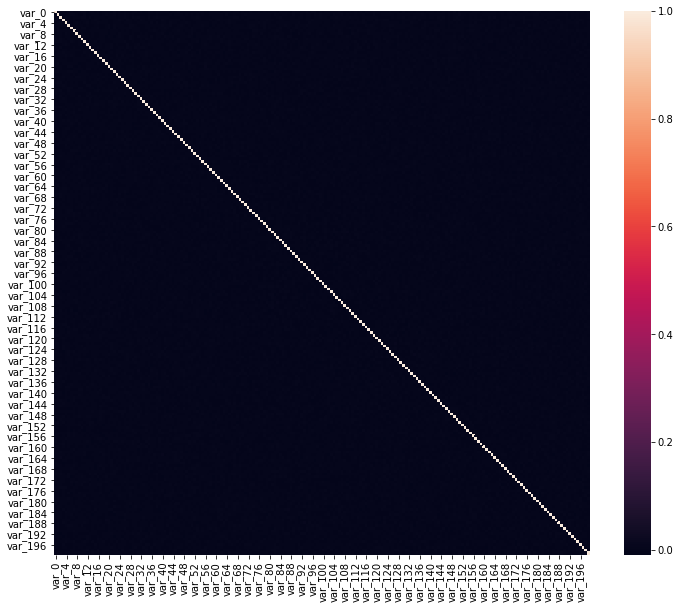

In [28]:
#check correlation for each column 
plt.figure(figsize=(12,10))
sns.heatmap(test_df_corr)

##### Check if any feature is normal distributed
Use pdf plot, qq plot, p values to decide if any feature is normal distributed. All p values are zero. No feature is normal distributed.

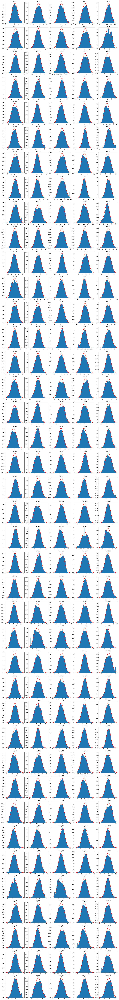

In [29]:
from scipy.stats import norm
nrows, ncols = 40, 5
plt.figure(figsize=(20,180))
for i in range(1, 201):
    binedges=np.linspace(min(train_df.iloc[:,i]),max(train_df.iloc[:,i]),60)
    plt.subplot(nrows, ncols, i)
    plt.hist(train_df.iloc[:,i], bins=binedges, density=True)
    p = norm.pdf(binedges, np.mean(train_df.iloc[:,i]), np.std(train_df.iloc[:,i]))
    plt.plot(binedges, p, 'r', linewidth=2)
    plt.title(train_df.columns.values[i])

plt.show()
    

<Figure size 432x432 with 0 Axes>

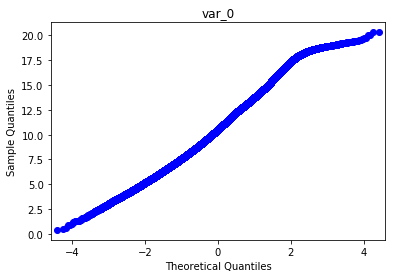

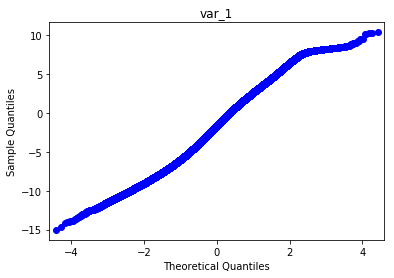

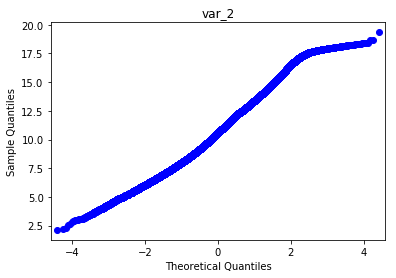

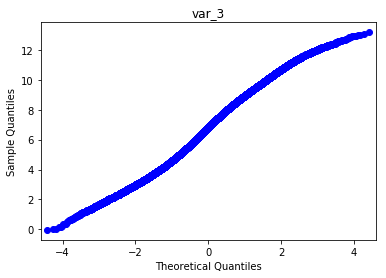

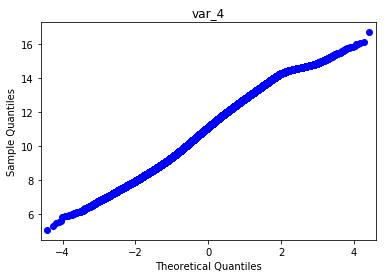

...

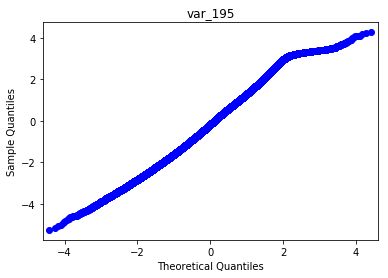

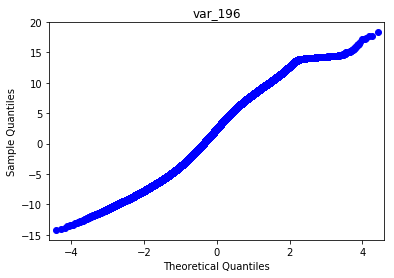

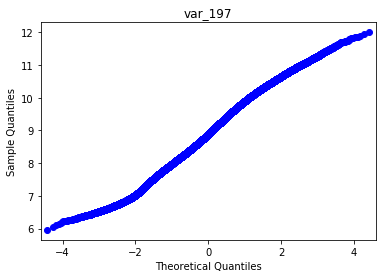

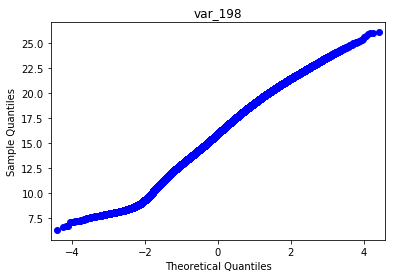

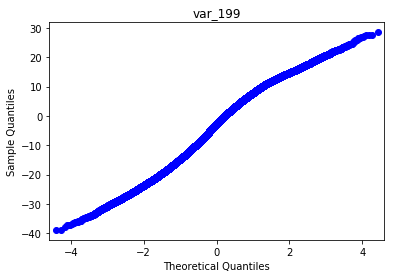

In [30]:
#qq plot for each feature
import statsmodels.api as sm
plt.figure(figsize=(6,6))
for i in range(1, 201):
    fig = sm.qqplot(train_df.iloc[:,i], dist=norm, loc=0,scale=1)
    plt.title(train_df.columns.values[i])
    plt.show()
    


In [31]:
skew = {}
kurtosis = {}
JB = {}
JB_p = {}
KS = {}
KS_p = {}
for i in range(1, 201):
    skew[i] = stats.skew(train_df.iloc[:,i])   #Skewness is not close to zero
    kurtosis[i] = stats.kurtosis(train_df.iloc[:,i], fisher=False)     #kurtosis is close to 3
    JB[i],JB_p[i]=stats.jarque_bera(train_df.iloc[:,i])
    KS[i],KS_p[i]=stats.kstest(train_df.iloc[:,i],'norm')

In [32]:
JB_p.values()

dict_values([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

In [33]:
KS_p.values()

dict_values([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

#### Outlier
Observe outliers of each feature using boxplot based on target value. From the box plot we can see almost all features have outliers, no matter target is 0 or 1.

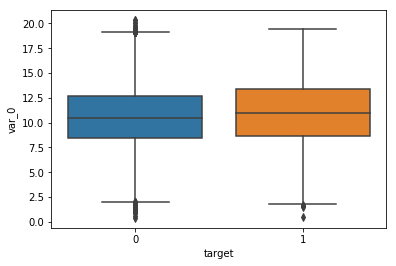

In [34]:
sns.boxplot(x=train_df.target, y=train_df.var_0, data=train_df)

In [36]:
# code is based upon
# https://stackoverflow.com/questions/34830597/pandas-melt-function
train_df0 = pd.melt(train_df,id_vars =['target'])
train_df1 = train_df0[:5000000]
train_df2 = train_df0[5000000:10000000]
train_df3 = train_df0[10000000:15000000]
train_df4 = train_df0[15000000:20000000]
train_df5 = train_df0[20000000:25000000]
train_df6 = train_df0[25000000:30000000]
train_df7 = train_df0[30000000:35000000]
train_df8 = train_df0[35000000:40000000]
train_df8

,target,variable,value
35000000,0,var_175,7.7423
35000001,0,var_175,10.4968
35000002,0,var_175,10.9202
35000003,0,var_175,8.1013
35000004,0,var_175,16.3309
35000005,0,var_175,9.2654
35000006,0,var_175,12.7942
35000007,0,var_175,13.2008
35000008,0,var_175,13.0201
35000009,0,var_175,7.5652


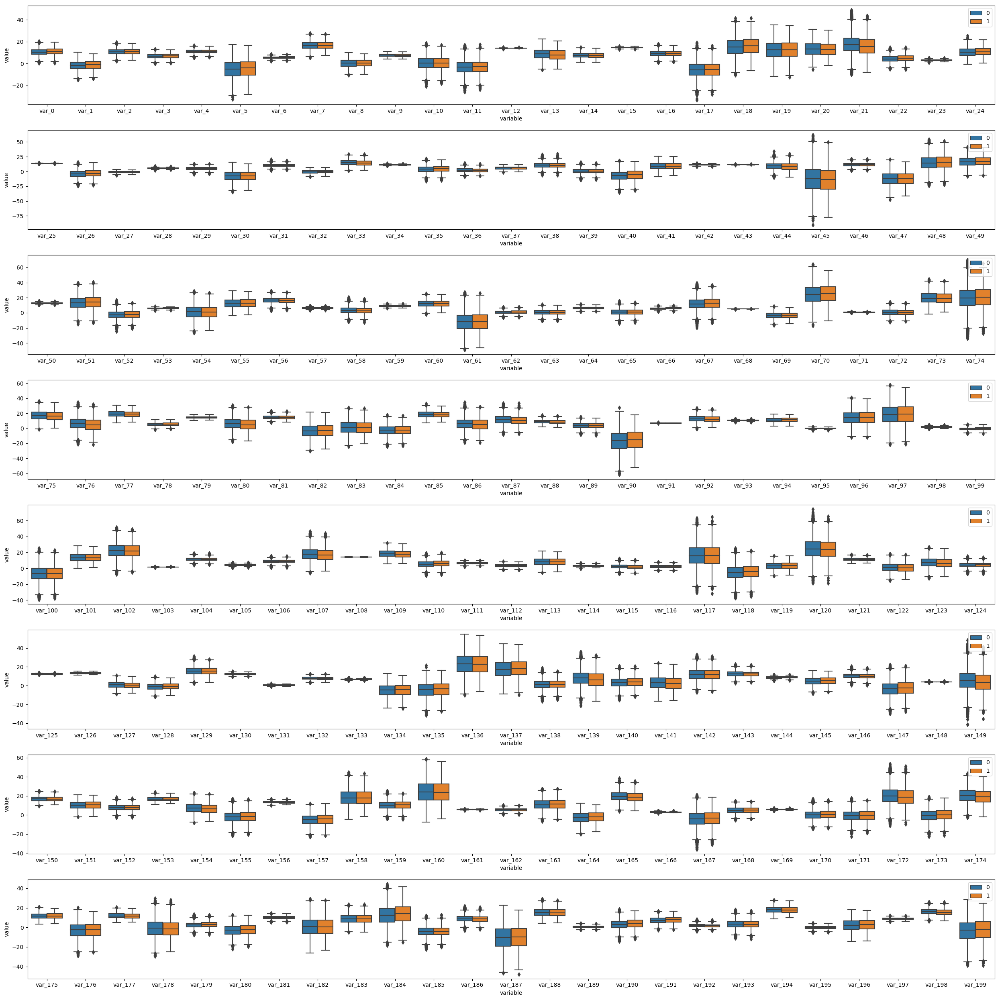

In [37]:
# code is based upon
#https://www.kaggle.com/unerue/simple-eda-and-building-a-model
fig, axes = plt.subplots(8, 1, figsize=(25, 25), dpi=100)

for i, df in enumerate([train_df1, train_df2, train_df3, train_df4, train_df5, train_df6, train_df7, train_df8]):
    sns.boxplot(x='variable', y='value', hue='target', data=df, ax=axes.flat[i])
    axes.flat[i].legend(loc='upper right')
fig.tight_layout()
plt.show()

Construct dataframe df_out. We check for each row to see if any of the values of this row is outlier. If yes, then  this row belongs to this Dataframe df_out.  There are 24896 records in df_out. Which means more than 10% of the records has outlier.


In [29]:
train_Q1 = X.quantile(0.25)
train_Q3 = X.quantile(0.75)
train_IQR = train_Q3 - train_Q1
print(train_IQR)

var_0       4.304350
var_1       6.098650
var_2       3.794225
var_3       3.070025
var_4       2.377950
var_5      12.125150
var_6       1.235300
var_7       5.159100
var_8       5.255700
var_9       1.965625
var_10      7.977875
var_11      8.363425
var_12      0.270200
var_13      7.201975
var_14      3.488550
var_15      0.611700
var_16      3.603625
var_17      9.665450
var_18     11.835375
var_19     12.156825
var_20      9.251600
var_21     11.538050
var_22      4.110800
var_23      0.769700
var_24      5.866600
var_25      0.407300
var_26      8.231525
var_27      2.323525
var_28      1.101600
var_29      3.627225
             ...    
var_170     6.354900
var_171     7.677150
var_172    12.175950
var_173     8.629425
var_174    10.576625
var_175     4.373900
var_176    11.090900
var_177     4.122625
var_178    12.734450
var_179     3.765550
var_180     7.670100
var_181     1.926600
var_182    13.563600
var_183     6.704325
var_184    13.792850
var_185     6.769350
var_186     4

In [30]:
train_df_outlier = (X < (train_Q1 - 1.5 * train_IQR)) |(X > (train_Q3 + 1.5 * train_IQR))
train_df_outlier 

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
ID_code,,,,,,,,,,,,,,,,,,,,,
train_0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
train_1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
train_2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
train_3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
train_4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
train_5,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
train_6,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
train_7,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
train_8,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [31]:
# code is based upon
#https://www.kaggle.com/nick2logan/eda-outlierremoval
df_out = X[((X < (train_Q1 - 1.5 * train_IQR)) |(X > (train_Q3 + 1.5 * train_IQR))).any(axis=1)]
df_out.index

Index(['train_1', 'train_14', 'train_19', 'train_31', 'train_41', 'train_42',
       'train_45', 'train_48', 'train_56', 'train_66',
       ...
       'train_199966', 'train_199967', 'train_199971', 'train_199973',
       'train_199979', 'train_199984', 'train_199986', 'train_199987',
       'train_199996', 'train_199998'],
      dtype='object', name='ID_code', length=24896)

In [32]:
df_out

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
ID_code,,,,,,,,,,,,,,,,,,,,,
train_1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
train_14,13.8080,5.0514,17.2611,8.5120,12.8517,-9.1622,5.7327,21.0517,-4.5117,6.8116,...,1.0740,8.3220,3.2619,1.6738,17.4797,-0.0257,-3.5323,9.3439,24.4479,-5.1110
train_19,4.4090,-0.7863,15.1828,8.0631,11.2831,-0.7356,6.3801,16.0218,2.4621,8.2108,...,5.9745,6.3267,2.5156,8.9878,16.0550,-2.1962,8.3985,9.1711,14.7352,3.9133
train_31,11.8967,2.4613,9.6047,6.5331,12.3928,-16.5167,6.1583,15.8343,-5.2882,7.0369,...,6.8673,14.1812,0.4632,7.6441,18.7412,0.6773,9.1396,8.9020,17.2176,-19.1430
train_41,9.2474,2.4231,9.0991,7.3115,9.1967,0.0512,5.8244,13.6145,5.7337,8.1224,...,-1.3996,6.8681,1.2737,3.5217,17.1380,0.0401,1.4130,7.6351,17.7996,-15.5445
train_42,9.0143,-6.9861,15.3908,9.0216,10.2545,-15.1629,5.2685,16.5620,3.3576,9.4736,...,9.9122,7.8639,0.5773,4.6717,19.5276,0.3066,5.7188,8.2301,10.8854,-5.8121
train_45,10.5805,-4.7731,8.2096,5.9208,12.6453,-0.9987,5.9827,19.1669,2.0889,7.4230,...,4.1395,2.3070,0.3339,-3.8902,20.4230,-0.6471,4.8620,9.2314,20.0579,-7.3688
train_48,11.3170,3.4296,10.3885,8.7089,11.1998,-11.7410,6.6039,20.9220,-3.4366,6.7491,...,5.5785,8.9589,2.0020,-1.3904,21.5708,-0.2603,2.4122,9.1352,19.3457,-16.0451
train_56,8.3603,-5.4082,14.0943,3.4998,10.2044,0.8095,4.9723,10.1037,1.1172,8.3246,...,9.0692,8.7550,0.8527,10.0298,21.3628,1.2421,8.6927,7.8396,17.0474,-22.3296


Observe target of out_df. 2993 out of 24896 has a target value of 1. This is only a little more than 10%. So it seems outlier doesn't affect target. But we still can consider to delete outlier when we build model in the future.

In [171]:
# Observe target of out_df
y1 = y[y.values==1]
len(set(df_out.index).intersection(set(y1.index)))

2993

### Feature Engineering:
#### PCA

For all features, the eigenvalue is 0.006 or 0.005. So we can not use PCA to do feature engineering.
It also shows that the data has been processed by Santander before they release. 

In [53]:
from sklearn import preprocessing
train_feature_scale = preprocessing.scale(train_df.iloc[:,2:])
cov_mat = train_feature_scale.T.dot (train_feature_scale)
eig_vals, eig_vecs = np.linalg.eig(cov_mat)
eig_vals = eig_vals/sum(eig_vals)
eig_val_cumsum = np.cumsum(eig_vals)
print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals.round(3))
print('\nEigenvalues cumulative sum \n%s' %eig_val_cumsum.round(3))

Eigenvectors 
[[ 0.10629592 -0.02497008 -0.03124915 ... -0.00408366  0.00645276
   0.01225703]
 [ 0.12045275 -0.11419139 -0.08153763 ...  0.12801365 -0.0060382
   0.00887447]
 [ 0.01388748  0.00382325  0.0059296  ... -0.10806812  0.03627967
   0.01355287]
 ...
 [-0.05794002  0.07248786  0.04909726 ...  0.01549596  0.07964928
   0.05167379]
 [-0.10847033 -0.01044512 -0.02130992 ...  0.06224735 -0.09757003
  -0.01120874]
 [ 0.07336758 -0.08373342  0.02150122 ...  0.07640211 -0.15080437
  -0.02638687]]

Eigenvalues 
[0.006 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005
 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005
 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005
 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005
 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005
 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005 0.005
 0.005 0.005 0.005 0.005 0.005 0.005 0.005 

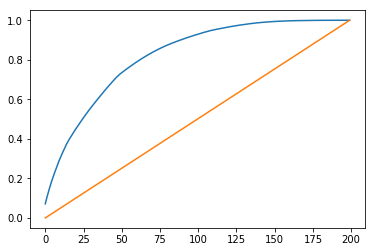

In [61]:
# code is based upon
#https://www.kaggle.com/c/santander-customer-transaction-prediction/discussion/82457
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(X)

plt.plot(np.arange(200), np.cumsum(pca.explained_variance_ratio_))
plt.plot(np.arange(200), np.linspace(0, 1, 200))

#### We still want to try something new to do the feature engineering
#### Removing features with low variance
We considered remove features with low variance. But when we use MinMaxScaler to scaled the feature, the max variance of all features is 0.033, the min variance of all features is :  0.013. There is not a big difference. So we cannot remove features with low variance

In [64]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_scale = scaler.fit_transform(X)
print('After MinMaxScaler, the max variance of all features is : ',DataFrame(X_scale).var().max())
print('After MinMaxScaler, the min variance of all features is : ',DataFrame(X_scale).var().min())

#https://stackoverflow.com/questions/39812885/retain-feature-names-after-scikit-feature-selection
#https://scikit-learn.org/stable/modules/feature_selection.html
#Removing features with low variance
#from sklearn.feature_selection import VarianceThreshold
#def variance_threshold_selector(data, threshold=0.1):
    #selector = VarianceThreshold(threshold)
    #selector.fit(data)
    #return data[data.columns[selector.get_support(indices=True)]]
#variance_threshold_selector(X)

After MinMaxScaler, the max variance of all features is :  0.03334009510675893
After MinMaxScaler, the min variance of all features is :  0.013436393865514906


#### KDE plot based on target value.
Make KDE plot for each feature based on target.
From the plot we can see for some features, such as var_1, var_2, var_13, the distribution is different for different target values.
Some features, such as var_3, var_4, the distribution is the same for different target values.
So we created a list contains features (85 features) whose distribution is different for different target values manually. We may use these features to build our model in the future.

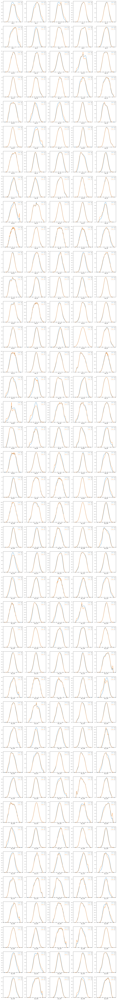

In [50]:
# video about KDE plot https://www.youtube.com/watch?v=R6_LR-f6Tt4
# code is based upon
# https://seaborn.pydata.org/tutorial/distributions.html
nrows, ncols = 40, 5
plt.figure(figsize=(20,180))
df0 = train_df[train_df['target'] == 0]
df1 = train_df[train_df['target'] == 1]

for i in range(1, 201):
    plt.subplot(nrows, ncols ,i)
    sns.kdeplot(df0.iloc[:,i], bw=0.5,label=0)
    sns.kdeplot(df1.iloc[:,i], bw=0.5,label=1)
    plt.xlabel(df0.columns.values[i])
    locs, labels = plt.xticks()
    plt.tick_params(axis='x', which='major', labelsize=6, pad=-6)
    plt.tick_params(axis='y', which='major', labelsize=6)
plt.show();

In [5]:
feature1 = [0,1,2,5,6,9,13,18,19,20,21,22,24,26,30,35,36,40,44,45,47,48,49,51,52,54,55,56,61,67,70,75,76,80,81,82,83,86,87,89,90,92,94,96,97,99,101,102,107,109,110,115,117,118,119,120,122,123,127,137,139,141,147,149,151,154,157,160,163,164,165,170,173,174,177,178,180,182,184,187,188,191,196,198,199]
#feature2 = [7,8,10,11,17,32,33,53,58,60,73,74,77,78,88,93,128,134,135,136,145,146,155,167,171,172,175,176,179,190,]
feature_kde1 = []
#feature_kde2 = []
for i in feature1:
    feature_kde1.append('var_' + str(i))
#for i in feature2:
    #feature_kde2.append('var_' + str(i))
#feature_kde = feature_kde1 + feature_kde2
print(len(feature_kde1))
feature_kde1


85


['var_0',
 'var_1',
 'var_2',
 'var_5',
 'var_6',
 'var_9',
 'var_13',
 'var_18',
 'var_19',
 'var_20',
 'var_21',
 'var_22',
 'var_24',
 'var_26',
 'var_30',
 'var_35',
 'var_36',
 'var_40',
 'var_44',
 'var_45',
 'var_47',
 'var_48',
 'var_49',
 'var_51',
 'var_52',
 'var_54',
 'var_55',
 'var_56',
 'var_61',
 'var_67',
 'var_70',
 'var_75',
 'var_76',
 'var_80',
 'var_81',
 'var_82',
 'var_83',
 'var_86',
 'var_87',
 'var_89',
 'var_90',
 'var_92',
 'var_94',
 'var_96',
 'var_97',
 'var_99',
 'var_101',
 'var_102',
 'var_107',
 'var_109',
 'var_110',
 'var_115',
 'var_117',
 'var_118',
 'var_119',
 'var_120',
 'var_122',
 'var_123',
 'var_127',
 'var_137',
 'var_139',
 'var_141',
 'var_147',
 'var_149',
 'var_151',
 'var_154',
 'var_157',
 'var_160',
 'var_163',
 'var_164',
 'var_165',
 'var_170',
 'var_173',
 'var_174',
 'var_177',
 'var_178',
 'var_180',
 'var_182',
 'var_184',
 'var_187',
 'var_188',
 'var_191',
 'var_196',
 'var_198',
 'var_199']

#### Using ExtraTreesClassifier fits multiple decision trees to do feature engineer

It automatically chose 70 features. When we printed out these 70 features, a lot of them are the same as the features we chose based on KDE plot.

In [13]:
#https://mikulskibartosz.name/forward-feature-selection-in-scikit-learn-f6476e474ddd
#Using ExtraTreesClassifier fits multiple decision trees to do feature engineer
#This is a feature selection technique for classification problem. 
#ExtraTreesClassifier fits features with multiple decision trees

estimator = ExtraTreesClassifier(n_estimators = 10)
featureSelection = SelectFromModel(estimator)
featureSelection.fit(X, y)
selectedFeatures = featureSelection.transform(X)
print(selectedFeatures.shape)
feature_ExtraTree = X.columns[featureSelection.get_support()]
list(feature_ExtraTree)

(200000, 70)


['var_0',
 'var_1',
 'var_2',
 'var_5',
 'var_6',
 'var_9',
 'var_12',
 'var_13',
 'var_18',
 'var_21',
 'var_22',
 'var_26',
 'var_33',
 'var_34',
 'var_35',
 'var_40',
 'var_44',
 'var_51',
 'var_53',
 'var_56',
 'var_67',
 'var_75',
 'var_76',
 'var_78',
 'var_80',
 'var_81',
 'var_86',
 'var_89',
 'var_91',
 'var_92',
 'var_93',
 'var_94',
 'var_95',
 'var_99',
 'var_106',
 'var_108',
 'var_109',
 'var_110',
 'var_115',
 'var_119',
 'var_121',
 'var_123',
 'var_127',
 'var_130',
 'var_133',
 'var_139',
 'var_146',
 'var_147',
 'var_148',
 'var_149',
 'var_154',
 'var_155',
 'var_157',
 'var_162',
 'var_163',
 'var_164',
 'var_165',
 'var_166',
 'var_169',
 'var_170',
 'var_172',
 'var_173',
 'var_174',
 'var_179',
 'var_184',
 'var_188',
 'var_190',
 'var_191',
 'var_197',
 'var_198']

#### Using SelectKBest to do feature selection
We select 100 features here. We set k equal to 100 here, becasue we selected 85 features based on KDE plot, and 70 features with ExtraTreesClassifier. To avaoid losing informations, we want to choose a number greater than 70 and 85 here. So we choose 100.

In [14]:
# code is based upon
#https://stats.stackexchange.com/questions/253086/selectkbest-feature-selection-python-scikit-learn
from sklearn.feature_selection import SelectKBest
def selectBest_selector(data, target, k):
    selectBest = SelectKBest(k = k)
    selector = selectBest.fit(data, target)
    #selectBest_features = fit.transform(X)
    #selector = VarianceThreshold(threshold)
    #selector.fit(data)
    return data[data.columns[selector.get_support(indices=True)]]
feature_selectBest = selectBest_selector(X,y,100)
feature_selectBest.columns

Index(['var_0', 'var_1', 'var_2', 'var_5', 'var_6', 'var_9', 'var_12',
       'var_13', 'var_18', 'var_21', 'var_22', 'var_24', 'var_26', 'var_32',
       'var_33', 'var_34', 'var_35', 'var_36', 'var_40', 'var_43', 'var_44',
       'var_48', 'var_49', 'var_52', 'var_53', 'var_56', 'var_67', 'var_70',
       'var_71', 'var_75', 'var_76', 'var_78', 'var_80', 'var_81', 'var_86',
       'var_87', 'var_89', 'var_90', 'var_91', 'var_92', 'var_93', 'var_94',
       'var_95', 'var_99', 'var_104', 'var_106', 'var_107', 'var_108',
       'var_109', 'var_110', 'var_111', 'var_114', 'var_115', 'var_118',
       'var_119', 'var_121', 'var_122', 'var_123', 'var_125', 'var_127',
       'var_128', 'var_130', 'var_131', 'var_133', 'var_135', 'var_137',
       'var_139', 'var_141', 'var_145', 'var_146', 'var_147', 'var_148',
       'var_149', 'var_151', 'var_154', 'var_155', 'var_157', 'var_162',
       'var_163', 'var_164', 'var_165', 'var_166', 'var_167', 'var_169',
       'var_170', 'var_172', 'var_1

#### Combine features selected by KDE, ExtraTreesClassifier , SelectKBest
We ended up with 123 features. 

In [16]:
selected_feature1 = list(set(feature_kde1) | set(list(feature_ExtraTree)) |set(list(feature_selectBest.columns)) ) 
for i in range(len(selected_feature1)):
    selected_feature1[i] = int(selected_feature1[i][4:])
selected_feature1 = sorted(selected_feature1)
selected_feature = []
for i in selected_feature1:
    selected_feature.append('var_' + str(i))
len(selected_feature)


123

#### Downsample data

Since the target for train is not balance, we decide to downsample data to make it balance. Ramdomly select 20098 records from train_df whose target value is 0, combine it together with records whose target value is 1. 

In [17]:
# downsample 0 target records step 1
train_df1 = train_df[train_df['target']==1]   #target ==1
train_df0 = train_df[train_df['target']==0]  #target == 0


In [18]:
# downsample 0 target records step 2
#downsample, choose 20098 records randomly with 0 target value, keep all records with target =1
#code is based upon
#https://elitedatascience.com/imbalanced-classes
from sklearn.utils import resample
# Separate majority and minority classes
df_majority = train_df0
df_minority = train_df1
 
# Downsample majority class
df_majority_downsampled = resample(df_majority, 
                                 replace=False,    # sample without replacement
                                 n_samples=20098,     # to match minority class
                                 random_state=123) # reproducible results
 
# Combine minority class with downsampled majority class
df_downsampled1 = pd.concat([df_majority_downsampled, df_minority])
df_downsampled = DataFrame(df_downsampled1.sort_values(by="ID_code"))
#df_downsampled = df_downsampled1.sort_index(axis = 0)
print(df_downsampled)
 

              target    var_0    var_1    var_2    var_3    var_4    var_5  \
ID_code                                                                      
train_10           0   5.0702  -0.5447   9.5900   4.2987  12.3910 -18.8687   
train_100001       0  11.2321   0.8326  10.9387   7.4749   9.6369 -19.2275   
train_100003       1  12.0897  -4.7146   7.9690   7.3956  12.2021  -0.9740   
train_100006       0  11.1265  -7.5647  10.4091   8.3183  12.0801 -10.1778   
train_100007       0   4.5630   0.4805  16.0839   8.2870   9.0209 -12.4856   
train_100015       1  10.7561   3.6248   9.2510   8.9599  13.4740  -6.7065   
train_100020       1   9.6724  -7.1946  12.2830   3.8727   9.8460  -8.4609   
train_100022       0  10.0034  -2.3479   9.4200   7.2503  11.8508  -2.3826   
train_100023       1  14.5627  -7.9474  13.2786   3.9041   8.7551  -4.9176   
train_100031       0  16.1502  -6.9231   8.1510   6.1405   8.2151  -3.1210   
train_100036       1  18.5538  -6.0257   9.4136   9.5752   9.612

Created new dataframe with downsampled data and selected feature. This will be one dataset we will use to build our model

In [19]:
df_downsampled_feature = df_downsampled[selected_feature]
df_downsampled_feature.index
y_downsampled = y[df_downsampled_feature.index]
y_downsampled


ID_code
train_10        0
train_100001    0
train_100003    1
train_100006    0
train_100007    0
train_100015    1
train_100020    1
train_100022    0
train_100023    1
train_100031    0
train_100036    1
train_100042    0
train_100043    0
train_100051    0
train_100055    1
train_100057    1
train_100059    1
train_10006     1
train_100065    0
train_100068    0
train_10007     0
train_100070    0
train_100072    0
train_100076    0
train_100086    1
train_100087    1
train_100091    1
train_100093    1
train_100095    0
train_1001      0
               ..
train_99813     0
train_99814     1
train_99819     1
train_9983      1
train_99832     1
train_99835     0
train_99839     1
train_99840     1
train_99845     0
train_99853     0
train_99859     1
train_99872     0
train_99874     0
train_99875     0
train_9988      1
train_99882     0
train_99888     0
train_99893     1
train_9990      1
train_99903     1
train_99908     0
train_99923     0
train_99934     1
train_99959     0
tr

### Model

The competition use AUC score to evaluate kagglers' submission. So in most of our models we use AUC score to evaluate our model as well.

#### GBM
AUC score: 0.779.

When we use this model to predict test_df. We got 1/4 records who has a target value 1. This is much greater than 10%

In [20]:
X_train, X_test, y_train, y_test = train_test_split(df_downsampled_feature, y_downsampled, test_size=0.2, random_state=123)


In [69]:
gb=GradientBoostingClassifier(n_estimators=200,learning_rate=.1)
gb.fit(X_train,y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=200,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [70]:
y_pred_gb = gb.predict(X_test)

In [71]:
accuracy_score(y_test, y_pred_gb)

0.7791044776119403

0.779098275976973


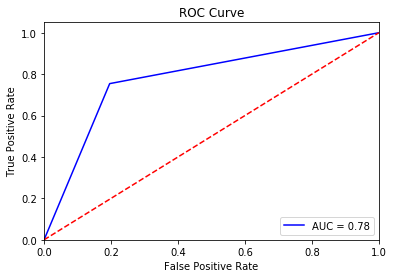

In [72]:
#code is based upon
#https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python
fpr, tpr, threshold = metrics.roc_curve(y_test, y_pred_gb)
roc_auc = metrics.auc(fpr, tpr)
print(roc_auc)
plt.title('ROC Curve')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [59]:
# predict test_df
test = test_df[selected_feature]
test_pred = gb.predict(test)

0    149418
1     50582
Name: target, dtype: int64


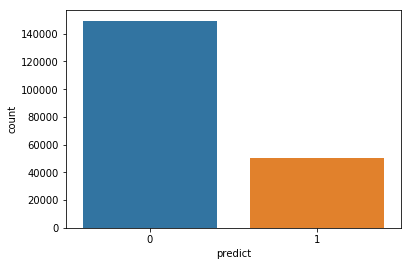

In [204]:
# plot value count for our prediction
test_pred_gb_feature_downsample = test_pred
predict_submission1 = DataFrame(test_pred_gb_feature_downsample, index = submission.index, columns = ['predict'])
predict_submission2 = pd.concat([submission ,predict_submission1], axis=1)
predict_submission_gb_feature_downsample = predict_submission2.drop(['target'], axis=1)
predict_submission_gb_feature_downsample.columns = ['target']
print(pd.Series(predict_submission_gb_feature_downsample.target).value_counts())
sns.countplot(x="predict", data=pd.DataFrame(test_pred_gb_feature_downsample, columns=["predict"]))

In [203]:
predict_submission_gb_feature_downsample.to_csv('santander-customer-transaction-prediction/submission_329.csv')

#### KNN
AUC score: 0.573.

We made pairplot based on target value. We can see the distribution of each feature is overlapped a lot with different target value. So KNN is not a good model for this problem.

In [217]:
#knn
accuracy_array = []
k_array = []
for k in range(3,50,2):
    knn = KNeighborsClassifier(n_neighbors=k)
    accuracy = cross_val_score(knn, X_train, y_train, cv=10, scoring='accuracy')
    accuracy_array.append(accuracy.mean())
    k_array.append(k)
print (accuracy_array)
print(k_array)

[0.558838439328441, 0.5642491288822273, 0.5695039105725316, 0.5726450672498414, 0.5735466923926522, 0.5736098875814126, 0.5734235332609179, 0.5720865363042823, 0.5710596913188921, 0.5730811354985537, 0.5719304638232277, 0.5715882886364365, 0.5718372673346194, 0.5723970654900271, 0.5713708590116164, 0.5707175934335085, 0.5720548515682731, 0.5721171276382403, 0.5718060469366828, 0.5697223460003691, 0.5693492407533253, 0.5685720420423748, 0.5668924828803382, 0.5677942242099814]
[3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49]


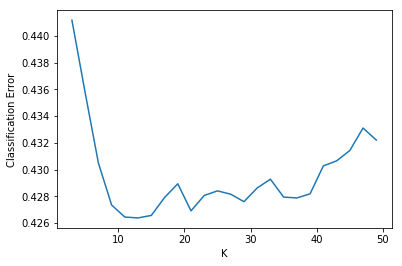

Optimal value of K is 13 


In [218]:
class_error = 1.0 - np.array(accuracy_array)
plt.plot(k_array, class_error)
plt.xlabel('K')
plt.ylabel('Classification Error')
plt.show()
min_ind = np.argmin(class_error)
OptK = k_array[min_ind]
print ("Optimal value of K is %d " %  OptK)

In [55]:
# Use Optimal value of K for test set
knn = KNeighborsClassifier(n_neighbors=OptK)

# fitting the model
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=13, p=2,
           weights='uniform')

In [56]:
# predict
y_pred_knn = knn.predict(X_test)

# evaluate accuracy
print(accuracy_score(y_test, y_pred))

0.573134328358209


0.5730561479329811


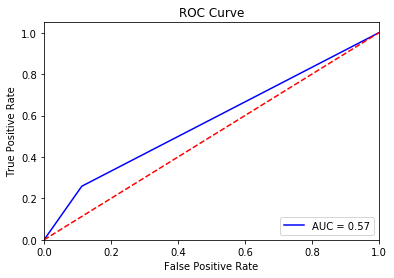

In [59]:
import sklearn.metrics as metrics
#https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python
fpr, tpr, threshold = metrics.roc_curve(y_test, y_pred_knn)
roc_auc = metrics.auc(fpr, tpr)
print(roc_auc)
plt.title('ROC Curve')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

Make scatterplot matrix to see why knn is not a good model. From the plot we can see the dots are overlapped a lot based on different target values. KNN is a good model when the clusters have a clear boundary. So that's why KNN is not good for this project.

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


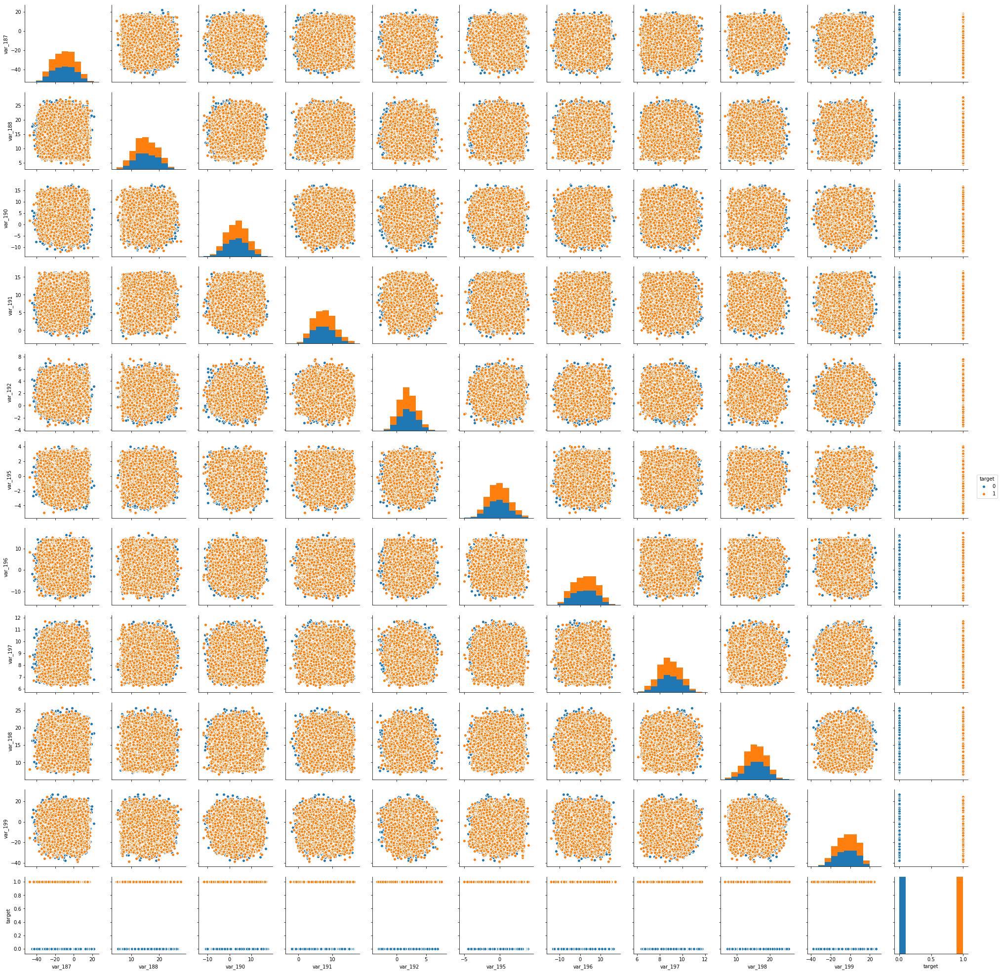

In [25]:
df_downsampled_feature1 = df_downsampled_feature
df_downsampled_feature1['target'] = y_downsampled
#df_downsampled_feature1
sns.pairplot(df_downsampled_feature1.iloc[:,-11:],hue = 'target')

#### Logistic Regression
AUC score: 0.768

The result of this model is similar with GBM

In [58]:
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [61]:
y_pred_log = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.3f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.769


0.7689056439757459


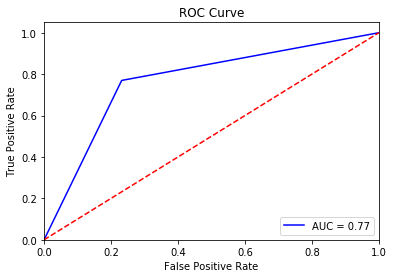

In [62]:
#https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python
fpr, tpr, threshold = metrics.roc_curve(y_test, y_pred_log)
roc_auc = metrics.auc(fpr, tpr)
print(roc_auc)
plt.title('ROC Curve')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

0    143401
1     56599
Name: target, dtype: int64


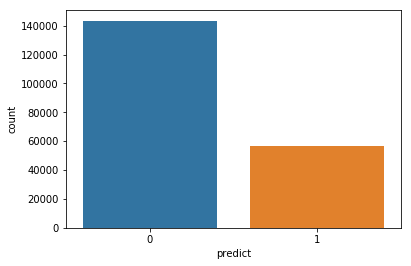

In [65]:
test_pred_logreg = logreg.predict(test)
test_pred_logreg_feature_downsample = test_pred_logreg
predict_submission1 = DataFrame(test_pred_logreg_feature_downsample, index = submission.index, columns = ['predict'])
predict_submission2 = pd.concat([submission ,predict_submission1], axis=1)
predict_submission_logreg_feature_downsample = predict_submission2.drop(['target'], axis=1)
predict_submission_logreg_feature_downsample.columns = ['target']
print(pd.Series(predict_submission_logreg_feature_downsample.target).value_counts())
sns.countplot(x="predict", data=pd.DataFrame(test_pred_logreg_feature_downsample, columns=["predict"]))

#### We read some kernals and discussions after we built previous models. It turns out a lot of people are using regression model even though this is a classification problem. They use regression model to predict the probability that a customer will make the next transaction, and get a good AUC score. So we decided to use regression model too.

#### linear regression:
AUC score: 0.849

This model is much better than classification models

In [63]:
from sklearn import linear_model
linreg1 = linear_model.LinearRegression()
linreg1.fit(X_train, y_train)
y_linear_pred = linreg1.predict(X_test)

0.8497143542062298


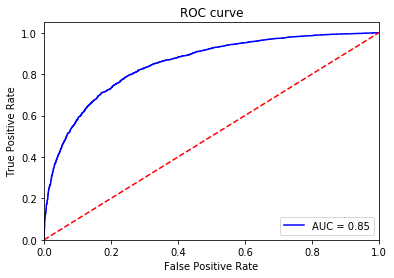

In [65]:
import sklearn.metrics as metrics
fpr, tpr, threshold = metrics.roc_curve(y_test, y_linear_pred)
roc_auc = metrics.auc(fpr, tpr)
print(roc_auc)
plt.title('ROC curve')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#### Linear regression on full train_df:

Since we changed to regression model, we decided to build a model on full train_df with all features to see how this model works.

AUC score: 0.858

The AUC score is a little better than Linear regression on downsampled data. This means downsample and feature selection didn't help us with the prediction.

In [66]:
X_train_full, X_test_full, y_train_full, y_test_full = train_test_split(train_df.iloc[:,1:], train_df.iloc[:,0], test_size=0.2, random_state=123)
                                                                        

In [67]:
from sklearn import linear_model
linreg = linear_model.LinearRegression()
linreg.fit(X_train_full, y_train_full)
y_full_linear_pred = linreg.predict(X_test_full)

0.8584382443860121


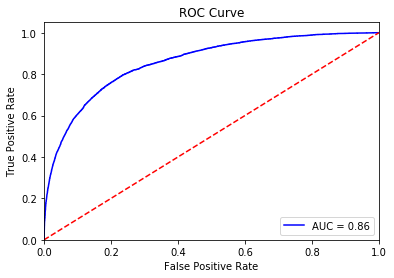

In [68]:
import sklearn.metrics as metrics
fpr, tpr, threshold = metrics.roc_curve(y_test_full, y_full_linear_pred)
roc_auc = metrics.auc(fpr, tpr)
print(roc_auc)
plt.title('ROC Curve')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#### Random Forest on downsampled data
AUC score: 0.812

Compared with linear regression, this AUC score is low.

In [45]:
regressor1 = RandomForestRegressor(n_estimators=200, random_state=0)  
regressor1.fit(X_train, y_train)  

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

In [46]:
y_pred_rf = regressor1.predict(X_test)

0.8121071763141492


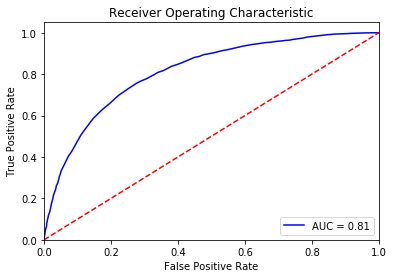

In [47]:
#https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python
fpr, tpr, threshold = metrics.roc_curve(y_test, y_pred_rf)
roc_auc = metrics.auc(fpr, tpr)
print(roc_auc)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#### Random Forest on full data
AUC score: 0.809

This score is a little lower than Random Forest on downsampled data. 

Compare with linear regression, the score is about 0.5 lower. 

In [50]:
regressor = RandomForestRegressor(n_estimators=200, random_state=0)  
regressor.fit(X_train_full, y_train_full)  

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

In [51]:
y_pred_rf_full = regressor.predict(X_test_full)

0.8086888309487704


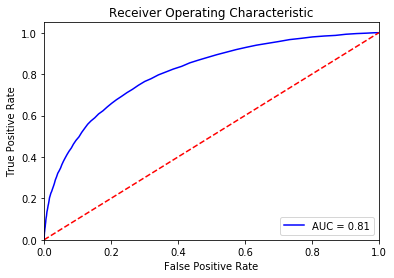

In [52]:
import sklearn.metrics as metrics
fpr, tpr, threshold = metrics.roc_curve(y_test_full, y_pred_rf_full)
roc_auc = metrics.auc(fpr, tpr)
print(roc_auc)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#### Lightgbm:

When we were learning from the kernal and discussion borad on kaggle, we found a lot of people use lightgbm to build model and get a great AUC score. So we decided to try lightgbm.


##### Tune parameter

We use Bayesian optimization to tune the parameter. Bayesian optimization finds the value that minimizes an objective function by building a probability model based on past evaluation results of the objective.

In [24]:
#References about tuning parameter
#https://towardsdatascience.com/automated-machine-learning-hyperparameter-tuning-in-python-dfda59b72f8a
#https://github.com/WillKoehrsen/hyperparameter-optimization/blob/master/Bayesian%20Hyperparameter%20Optimization%20of%20Gradient%20Boosting%20Machine.ipynb
#https://www.youtube.com/watch?v=V5158Oug4W8
#https://github.com/hyperopt/hyperopt/issues/253

N_FOLDS = 10

# Create the dataset
train_set = lgb.Dataset(X, y)

def objective(params, n_folds = N_FOLDS):
    """Objective function for Gradient Boosting Machine Hyperparameter Optimization"""
    
    # Keep track of evals
    global ITERATION
    
    ITERATION += 1
    
    # Retrieve the subsample if present otherwise set to 1.0
    subsample = params['boosting_type'].get('subsample', 1.0)
    
    # Extract the boosting type
    params['boosting_type'] = params['boosting_type']['boosting_type']
    params['subsample'] = subsample
    
    # Make sure parameters that need to be integers are integers
    for parameter_name in ['num_leaves', 'subsample_for_bin', 'min_child_samples']:
        params[parameter_name] = int(params[parameter_name])
    
    start = timer()
    
    # Perform n_folds cross validation
    cv_results = lgb.cv(params, train_set, num_boost_round = 10000, nfold = n_folds, 
                        early_stopping_rounds = 100, metrics = 'auc', seed = 50)
    
    run_time = timer() - start
    
    # Extract the best score
    best_score = np.max(cv_results['auc-mean'])
    
    # Loss must be minimized
    loss = 1 - best_score
    
    # Boosting rounds that returned the highest cv score
    n_estimators = int(np.argmax(cv_results['auc-mean']) + 1)

    # Write to the csv file ('a' means append)
    of_connection = open(out_file, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([loss, params, ITERATION, n_estimators, run_time])
    
    # Dictionary with information for evaluation
    return {'loss': loss, 'params': params, 'iteration': ITERATION,
            'estimators': n_estimators, 
            'train_time': run_time, 'status': STATUS_OK}

In [28]:

from hyperopt import hp
space = {    
    'boosting_type': hp.choice('boosting_type', 
                               [{'boosting_type': 'gbdt', 
                                    'subsample': hp.uniform('gdbt_subsample', 0.5, 1)}, 
                                 {'boosting_type': 'dart', 
                                     'subsample': hp.uniform('dart_subsample', 0.5, 1)}]),
    'bagging_freq': hp.choice('bagging_freq', np.arange(0, 10, dtype=int)),
    'bagging_fraction': hp.uniform('bagging_fraction', 0, 1),
    'feature_fraction': hp.uniform('feature_fraction', 0, 1),
    'num_leaves': hp.choice('num_leaves', np.arange(10, 50, dtype=int)),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(0.2)),
    'subsample_for_bin': hp.choice('subsample_for_bin', np.arange(20000, 300000,2000, dtype=int)),
    'min_child_samples': hp.choice('min_child_samples', np.arange(20, 500,5, dtype=int)),
    'reg_alpha': hp.uniform('reg_alpha', 0.0, 1.0),
    'reg_lambda': hp.uniform('reg_lambda', 0.0, 1.0),
    'colsample_bytree': hp.uniform('colsample_by_tree', 0.6, 1.0),
    'min_data_in_leaf': hp.choice('min_data_in_leaf', np.arange(50, 100, dtype=int)),
    'min_sum_hessian_in_leaf': hp.uniform('min_sum_hessian_in_leaf', 8.0, 13.0),
    'metric':'auc',
    'objective':'binary',
    'tree_learner': 'serial',
    'max_depth': -1,
    'verbosity': -1
}


In [29]:
sample(space)

{'bagging_fraction': 0.5371097177236448,
 'bagging_freq': 7,
 'boosting_type': {'boosting_type': 'dart', 'subsample': 0.6798667196191686},
 'colsample_bytree': 0.6939822235753969,
 'feature_fraction': 0.04474172029621004,
 'learning_rate': 0.18931348619010316,
 'max_depth': -1,
 'metric': 'auc',
 'min_child_samples': 135,
 'min_data_in_leaf': 94,
 'min_sum_hessian_in_leaf': 10.648089383833327,
 'num_leaves': 36,
 'objective': 'binary',
 'reg_alpha': 0.5500642701389391,
 'reg_lambda': 0.24705147375114267,
 'subsample_for_bin': 144000,
 'tree_learner': 'serial',
 'verbosity': -1}

In [7]:
tpe_algorithm = tpe.suggest

In [8]:
import csv

# File to save first results
out_file = 'gbm_trials.csv'
of_connection = open(out_file, 'w')
writer = csv.writer(of_connection)

# Write the headers to the file
writer.writerow(['loss', 'params', 'iteration', 'estimators', 'train_time'])
of_connection.close()

In [33]:
from hyperopt import Trials

# Keep track of results
bayes_trials = Trials()

In [ ]:
# I spent 24 hours running this code. But it didn't finish after that. So we stopped it. But the parameters 
# found by these algorithm are stored in gbm_trials.csv
%%capture

# Global variable
global  ITERATION

ITERATION = 0

MAX_EVALS = 500

# Run optimization
best = fmin(fn = objective, space = space, algo = tpe.suggest, 
            max_evals = MAX_EVALS, trials = bayes_trials, rstate = np.random.RandomState(50))



In [30]:
parameter = pd.read_csv('gbm_trials.csv')
parameter

,loss,params,iteration,estimators,train_time
0,0.103499,"{'bagging_fraction': 0.353179372940467, 'baggi...",1,1183,282.939301
1,0.146789,"{'bagging_fraction': 0.11571722800265183, 'bag...",2,1892,3387.547398
2,0.103214,"{'bagging_fraction': 0.8922578121814408, 'bagg...",3,10000,39164.133690
3,0.101936,"{'bagging_fraction': 0.6419307449664439, 'bagg...",4,3001,1235.345987
4,0.109235,"{'bagging_fraction': 0.6672659489041175, 'bagg...",5,696,1980.210562
5,0.115643,"{'bagging_fraction': 0.2544512652076899, 'bagg...",6,281,112.177688
6,0.119729,"{'bagging_fraction': 0.2179587586713716, 'bagg...",7,2120,208.376066
7,0.113768,"{'bagging_fraction': 0.2920991994644212, 'bagg...",8,792,1686.997097
8,0.110872,"{'bagging_fraction': 0.5102779817750797, 'bagg...",9,372,393.857961
9,0.101354,"{'bagging_fraction': 0.7167750872569865, 'bagg...",10,6327,2771.098981


In [31]:
param = parameter[parameter['loss']==parameter['loss'].min()]
param = param['params']
print(param)

9    {'bagging_fraction': 0.7167750872569865, 'bagg...
Name: params, dtype: object


In [32]:
# This is the best parameter we found
param = {'bagging_fraction': 0.7167750872569865, 
         'bagging_freq': 6, 
         'boosting_type': 'gbdt', 
         'colsample_bytree': 0.8910899560384806, 
         'feature_fraction': 0.7627003387912878, 
         'learning_rate': 0.012905306798742007, 
         'max_depth': -1, 
         'metric': 'auc', 
         'min_child_samples': 240, 
         'min_data_in_leaf': 95, 
         'min_sum_hessian_in_leaf': 12.169686210442862, 
         'num_leaves': 11,
         'num_threads': 8,
         'objective': 'binary', 
         'reg_alpha': 0.18384929026317198, 
         'reg_lambda': 0.11648041596557968, 
         'subsample_for_bin': 136000, 
         'tree_learner': 'serial', 
         'verbosity': -1, 
         'subsample': 0.6658484545666271}


##### Lightgbm on full data set
AUC score: 0.900

This is the best model until now

In [50]:
# code is based upon
#https://www.kaggle.com/apj1995/lightgbm0-9
features = [c for c in train_df.columns if c not in ['target']]
target = train_df['target']

In [52]:
num_folds = 11
folds = StratifiedKFold(n_splits=num_folds, shuffle=False, random_state=2319)
oof = np.zeros(len(train_df))
predictions = np.zeros(len(test_df))


In [119]:
print('Training the Model:')
for fold_, (trn_idx, val_idx) in enumerate(folds.split(train_df.values, target.values)):
    print("Fold idx:{}".format(fold_ + 1))
    trn_data = lgb.Dataset(train_df.iloc[trn_idx][features], label=target.iloc[trn_idx])
    val_data = lgb.Dataset(train_df.iloc[val_idx][features], label=target.iloc[val_idx])
    clf = lgb.train(param, trn_data, 1000000, valid_sets = [trn_data, val_data], verbose_eval=5000, early_stopping_rounds = 4000)
    oof[val_idx] = clf.predict(train_df.iloc[val_idx][features], num_iteration=clf.best_iteration)
    predictions += clf.predict(test_df[features], num_iteration=clf.best_iteration) / folds.n_splits
print("CV score: {:<8.5f}".format(roc_auc_score(target, oof)))



Training the Model:
Fold idx:1
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.928596	valid_1's auc: 0.898825
[10000]	training's auc: 0.946132	valid_1's auc: 0.900794
[15000]	training's auc: 0.960339	valid_1's auc: 0.900547
Early stopping, best iteration is:
[11152]	training's auc: 0.949674	valid_1's auc: 0.900877
Fold idx:2
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.929067	valid_1's auc: 0.897372
[10000]	training's auc: 0.946471	valid_1's auc: 0.898099
Early stopping, best iteration is:
[8200]	training's auc: 0.940677	valid_1's auc: 0.898198
Fold idx:3
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.929263	valid_1's auc: 0.89171
[10000]	training's auc: 0.946635	valid_1's auc: 0.893145
Early stopping, best iteration is:
[10647]	training's auc: 0.948629	valid_1's auc: 0.893306
Fold idx:4
Training until validation scores don't improve for 4000 rounds.
[5000]	tra

In [120]:
#https://www.kaggle.com/gtambi/lgbm-augmentation
test_pred_lgb_full = predictions
predict_submission1 = DataFrame(test_pred_lgb_full, index = submission.index, columns = ['predict'])
predict_submission2 = pd.concat([submission ,predict_submission1], axis=1)
predict_submission_lgb_full = predict_submission2.drop(['target'], axis=1)
predict_submission_lgb_full.columns = ['target']

In [121]:
predict_submission_lgb_full.to_csv('santander-customer-transaction-prediction/submission_331.csv')

(array([1.75406730e+01, 1.57907139e+01, 1.10197831e+01, 7.89009653e+00,
        6.10607001e+00, 4.80399617e+00, 3.91473835e+00, 3.20683903e+00,
        2.73390417e+00, 2.32559706e+00, 2.03251772e+00, 1.80857505e+00,
        1.54004424e+00, 1.32962831e+00, 1.20237677e+00, 1.12121633e+00,
        9.93964792e-01, 9.14808322e-01, 8.26634026e-01, 7.51986468e-01,
        6.86857727e-01, 6.21728986e-01, 5.75637876e-01, 5.38564593e-01,
        4.95980416e-01, 4.60410103e-01, 4.36362568e-01, 3.89269478e-01,
        4.22835829e-01, 3.31655591e-01, 3.38168465e-01, 3.27647668e-01,
        2.97588249e-01, 2.94582307e-01, 2.68530811e-01, 2.47489217e-01,
        2.30455547e-01, 2.25445643e-01, 2.27950595e-01, 2.06909002e-01,
        2.01398108e-01, 1.83863447e-01, 1.65827796e-01, 1.63322844e-01,
        1.59314921e-01, 1.46790163e-01, 1.51299076e-01, 1.38273328e-01,
        1.32261444e-01, 1.22241638e-01, 1.24245599e-01, 1.40277289e-01,
        1.08213909e-01, 1.27251541e-01, 1.08213909e-01, 1.147267

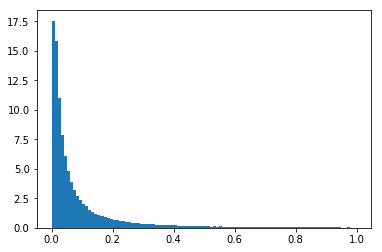

In [58]:
plt.hist(predictions, density=True, bins=100)

Find the 90% quantile "line" of prediction, when the prediction is less than "line", make it 0, when it is greater than "line" make it 1. Make this as a new prediction, submit to kaggle: AUC score is only 0.776

This method is not good.

In [62]:

line = Series(predictions).quantile(0.9)
line


0.23788724870272657

In [66]:
predictions_lgb_classify = np.zeros(len(predictions))
for i in range(len(predictions)):
    if predictions[i] < line:
        predictions_lgb_classify[i] = 0
    else:
        predictions_lgb_classify[i] = 1


array([0., 0., 0., ..., 0., 0., 0.])

In [70]:
pd.Series(predictions_lgb_classify).value_counts()

0.0    180000
1.0     20000
dtype: int64

In [71]:
test_pred_lgb_classify = predictions_lgb_classify
predict_submission1 = DataFrame(test_pred_lgb_classify, index = submission.index, columns = ['predict'])
predict_submission2 = pd.concat([submission ,predict_submission1], axis=1)
predict_submission_lgb_classify = predict_submission2.drop(['target'], axis=1)
predict_submission_lgb_classify.columns = ['target']

In [75]:
predict_submission_lgb_classify.target.value_counts()

0.0    180000
1.0     20000
Name: target, dtype: int64

In [74]:
predict_submission_lgb_classify.to_csv('santander-customer-transaction-prediction/submission_3302.csv')
#0.776

#### Lightgbm on downsampled dataset:
AUC score is 0.897. This model is not better than lightgbm on full dataset

In [68]:
features = [c for c in df_downsampled.columns if c not in ['target']]
target = df_downsampled['target']

In [52]:
num_folds = 15
folds = StratifiedKFold(n_splits=num_folds, shuffle=False, random_state=2319)
oof_downsampled = np.zeros(len(df_downsampled))
predictions_downsampled = np.zeros(len(test_df))

In [53]:
print('Training the Model:')
for fold_, (trn_idx, val_idx) in enumerate(folds.split(df_downsampled.values, target.values)):
    print("Fold idx:{}".format(fold_ + 1))
    trn_data = lgb.Dataset(df_downsampled.iloc[trn_idx][features], label=target.iloc[trn_idx])
    val_data = lgb.Dataset(df_downsampled.iloc[val_idx][features], label=target.iloc[val_idx])
    clf = lgb.train(param, trn_data, 1000000, valid_sets = [trn_data, val_data], verbose_eval=5000, early_stopping_rounds = 4000)
    oof_downsampled[val_idx] = clf.predict(df_downsampled.iloc[val_idx][features], num_iteration=clf.best_iteration)
    predictions_downsampled += clf.predict(test_df[features], num_iteration=clf.best_iteration) / folds.n_splits
print("CV score: {:<8.5f}".format(roc_auc_score(target, oof_downsampled)))

Training the Model:
Fold idx:1
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.943296	valid_1's auc: 0.894647
[10000]	training's auc: 0.965705	valid_1's auc: 0.894455
Early stopping, best iteration is:
[6634]	training's auc: 0.951193	valid_1's auc: 0.895728
Fold idx:2
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.942457	valid_1's auc: 0.90572
[10000]	training's auc: 0.965082	valid_1's auc: 0.906863
[15000]	training's auc: 0.981417	valid_1's auc: 0.907038
Early stopping, best iteration is:
[13225]	training's auc: 0.976422	valid_1's auc: 0.907483
Fold idx:3
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.942997	valid_1's auc: 0.896342
[10000]	training's auc: 0.965701	valid_1's auc: 0.896941
Early stopping, best iteration is:
[7963]	training's auc: 0.95716	valid_1's auc: 0.897702
Fold idx:4
Training until validation scores don't improve for 4000 rounds.
[5000]	train

In [78]:
test_pred_lgb_downsampled = predictions_downsampled
predict_submission1 = DataFrame(test_pred_lgb_downsampled, index = submission.index, columns = ['predict'])
predict_submission2 = pd.concat([submission ,predict_submission1], axis=1)
predict_submission_lgb_downsampled = predict_submission2.drop(['target'], axis=1)
predict_submission_lgb_downsampled.columns = ['target']

In [79]:
predict_submission_lgb_downsampled.to_csv('santander-customer-transaction-prediction/submission_3303.csv')
#900

#### Lightgbm on dataset without outlier.
AUC score is 0.899. 

The AUC score for this model is a little less than lightgbm on full dataset

In [33]:
df_out

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
ID_code,,,,,,,,,,,,,,,,,,,,,
train_1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
train_14,13.8080,5.0514,17.2611,8.5120,12.8517,-9.1622,5.7327,21.0517,-4.5117,6.8116,...,1.0740,8.3220,3.2619,1.6738,17.4797,-0.0257,-3.5323,9.3439,24.4479,-5.1110
train_19,4.4090,-0.7863,15.1828,8.0631,11.2831,-0.7356,6.3801,16.0218,2.4621,8.2108,...,5.9745,6.3267,2.5156,8.9878,16.0550,-2.1962,8.3985,9.1711,14.7352,3.9133
train_31,11.8967,2.4613,9.6047,6.5331,12.3928,-16.5167,6.1583,15.8343,-5.2882,7.0369,...,6.8673,14.1812,0.4632,7.6441,18.7412,0.6773,9.1396,8.9020,17.2176,-19.1430
train_41,9.2474,2.4231,9.0991,7.3115,9.1967,0.0512,5.8244,13.6145,5.7337,8.1224,...,-1.3996,6.8681,1.2737,3.5217,17.1380,0.0401,1.4130,7.6351,17.7996,-15.5445
train_42,9.0143,-6.9861,15.3908,9.0216,10.2545,-15.1629,5.2685,16.5620,3.3576,9.4736,...,9.9122,7.8639,0.5773,4.6717,19.5276,0.3066,5.7188,8.2301,10.8854,-5.8121
train_45,10.5805,-4.7731,8.2096,5.9208,12.6453,-0.9987,5.9827,19.1669,2.0889,7.4230,...,4.1395,2.3070,0.3339,-3.8902,20.4230,-0.6471,4.8620,9.2314,20.0579,-7.3688
train_48,11.3170,3.4296,10.3885,8.7089,11.1998,-11.7410,6.6039,20.9220,-3.4366,6.7491,...,5.5785,8.9589,2.0020,-1.3904,21.5708,-0.2603,2.4122,9.1352,19.3457,-16.0451
train_56,8.3603,-5.4082,14.0943,3.4998,10.2044,0.8095,4.9723,10.1037,1.1172,8.3246,...,9.0692,8.7550,0.8527,10.0298,21.3628,1.2421,8.6927,7.8396,17.0474,-22.3296


In [34]:
y

ID_code
train_0         0
train_1         0
train_2         0
train_3         0
train_4         0
train_5         0
train_6         0
train_7         0
train_8         0
train_9         0
train_10        0
train_11        0
train_12        0
train_13        1
train_14        0
train_15        0
train_16        0
train_17        0
train_18        0
train_19        0
train_20        0
train_21        0
train_22        0
train_23        0
train_24        0
train_25        0
train_26        0
train_27        0
train_28        0
train_29        1
               ..
train_199970    0
train_199971    0
train_199972    0
train_199973    0
train_199974    0
train_199975    0
train_199976    1
train_199977    0
train_199978    0
train_199979    0
train_199980    0
train_199981    1
train_199982    0
train_199983    0
train_199984    0
train_199985    0
train_199986    1
train_199987    0
train_199988    0
train_199989    0
train_199990    1
train_199991    0
train_199992    0
train_199993    0
tr

In [46]:
#create a datafram delete all outliers
train_delete_out = X[~X.index.isin(df_out.index)]
train_delete_out.index

Index(['train_0', 'train_2', 'train_3', 'train_4', 'train_5', 'train_6',
       'train_7', 'train_8', 'train_9', 'train_10',
       ...
       'train_199988', 'train_199989', 'train_199990', 'train_199991',
       'train_199992', 'train_199993', 'train_199994', 'train_199995',
       'train_199997', 'train_199999'],
      dtype='object', name='ID_code', length=175104)

In [42]:
target_delete_out = y[~y.index.isin(df_out.index)]
pd.Series(target_delete_out).value_counts()

0    157999
1     17105
Name: target, dtype: int64

In [48]:
features_delete_out = [c for c in train_delete_out.columns if c not in ['target']]

200

In [49]:
num_folds = 15
folds = StratifiedKFold(n_splits=num_folds, shuffle=False, random_state=2319)
oof_delete_out = np.zeros(len(target_delete_out))
predictions_delete_out = np.zeros(len(test_df))

In [50]:
print('Training the Model:')
for fold_, (trn_idx, val_idx) in enumerate(folds.split(train_delete_out.values, target_delete_out.values)):
    print("Fold idx:{}".format(fold_ + 1))
    trn_data = lgb.Dataset(train_delete_out.iloc[trn_idx][features], label=target_delete_out.iloc[trn_idx])
    val_data = lgb.Dataset(train_delete_out.iloc[val_idx][features], label=target_delete_out.iloc[val_idx])
    clf = lgb.train(param, trn_data, 1000000, valid_sets = [trn_data, val_data], verbose_eval=5000, early_stopping_rounds = 4000)
    oof_delete_out[val_idx] = clf.predict(train_delete_out.iloc[val_idx][features], num_iteration=clf.best_iteration)
    predictions_delete_out += clf.predict(test_df[features], num_iteration=clf.best_iteration) / folds.n_splits
print("CV score: {:<8.5f}".format(roc_auc_score(target_delete_out, oof_delete_out)))

Training the Model:
Fold idx:1
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.927053	valid_1's auc: 0.900531
[10000]	training's auc: 0.943992	valid_1's auc: 0.903466
[15000]	training's auc: 0.957639	valid_1's auc: 0.903493
Early stopping, best iteration is:
[14337]	training's auc: 0.955978	valid_1's auc: 0.903676
Fold idx:2
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.92815	valid_1's auc: 0.885831
[10000]	training's auc: 0.944829	valid_1's auc: 0.88849
[15000]	training's auc: 0.958299	valid_1's auc: 0.88847
Early stopping, best iteration is:
[11583]	training's auc: 0.949333	valid_1's auc: 0.888663
Fold idx:3
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.927073	valid_1's auc: 0.900923
[10000]	training's auc: 0.94406	valid_1's auc: 0.902404
Early stopping, best iteration is:
[9083]	training's auc: 0.941253	valid_1's auc: 0.902443
Fold idx:4
Training until valid

In [54]:
test_pred_lgb_delete_out = predictions_delete_out
predict_submission1 = DataFrame(test_pred_lgb_delete_out, index = submission.index, columns = ['predict'])
predict_submission2 = pd.concat([submission ,predict_submission1], axis=1)
predict_submission_lgb_delete_out = predict_submission2.drop(['target'], axis=1)
predict_submission_lgb_delete_out.columns = ['target']

In [56]:
predict_submission_lgb_delete_out.to_csv('santander-customer-transaction-prediction/submission_3301.csv')

In [76]:
predict_submission_lgb_delete_out

,target
ID_code,
test_0,0.109850
test_1,0.186534
test_2,0.158625
test_3,0.212960
test_4,0.035658
test_5,0.002254
test_6,0.007375
test_7,0.159624
test_8,0.002919


#### Lightgbm on upsampled data
AUC score is 0.900, similar as lightgbm on full dataset.

In [5]:
#code is based upon 
#https://www.kaggle.com/roydatascience/eda-pca-simple-lgbm-on-kfold-technique
#upsample function
def augment(x,y,t=2):
    xs,xn = [],[]
    for i in range(t):
        mask = y>0
        x1 = x[mask].copy()
        ids = np.arange(x1.shape[0])
        for c in range(x1.shape[1]):
            np.random.shuffle(ids)
            x1[:,c] = x1[ids][:,c]
        xs.append(x1)

    for i in range(t//2):
        mask = y==0
        x1 = x[mask].copy()
        ids = np.arange(x1.shape[0])
        for c in range(x1.shape[1]):
            np.random.shuffle(ids)
            x1[:,c] = x1[ids][:,c]
        xn.append(x1)

    xs = np.vstack(xs)
    xn = np.vstack(xn)
    ys = np.ones(xs.shape[0])
    yn = np.zeros(xn.shape[0])
    x = np.vstack([x,xs,xn])
    y = np.concatenate([y,ys,yn])
    return x,y

In [9]:
# code is based upon 
# https://www.kaggle.com/roydatascience/eda-pca-simple-lgbm-on-kfold-technique
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold,KFold
import lightgbm as lgb
num_folds = 11
features = [c for c in train_df.columns if c not in ['ID_code', 'target']]

folds = KFold(n_splits=num_folds, random_state=2319)
oof = np.zeros(len(X))
getVal = np.zeros(len(X))
predictions_final = np.zeros(len(y))
feature_importance_df = pd.DataFrame()

print('Light GBM Model')
for fold_, (trn_idx, val_idx) in enumerate(folds.split(X.values, y.values)):
    
    X_train, y_train = X.iloc[trn_idx][features], y.iloc[trn_idx]
    X_valid, y_valid = X.iloc[val_idx][features], y.iloc[val_idx]
    
    X_tr, y_tr = augment(X_train.values, y_train.values)
    X_tr = pd.DataFrame(X_tr)
    
    print("Fold idx:{}".format(fold_ + 1))
    trn_data = lgb.Dataset(X_tr, label=y_tr)
    val_data = lgb.Dataset(X_valid, label=y_valid)
    
    clf = lgb.train(param, trn_data, 1000000, valid_sets = [trn_data, val_data], verbose_eval=5000, early_stopping_rounds = 4000)
    oof[val_idx] = clf.predict(X.iloc[val_idx][features], num_iteration=clf.best_iteration)
    getVal[val_idx]+= clf.predict(X.iloc[val_idx][features], num_iteration=clf.best_iteration) / folds.n_splits    
    predictions_final += clf.predict(test_df[features], num_iteration=clf.best_iteration) / folds.n_splits

print("CV score: {:<8.5f}".format(roc_auc_score(y, oof)))

Light GBM Model
Fold idx:1
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.924533	valid_1's auc: 0.898589
[10000]	training's auc: 0.938451	valid_1's auc: 0.900286
[15000]	training's auc: 0.951037	valid_1's auc: 0.899905
Early stopping, best iteration is:
[11274]	training's auc: 0.941872	valid_1's auc: 0.900357
Fold idx:2
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.924538	valid_1's auc: 0.895814
[10000]	training's auc: 0.938505	valid_1's auc: 0.897814
Early stopping, best iteration is:
[10290]	training's auc: 0.939288	valid_1's auc: 0.897869
Fold idx:3
Training until validation scores don't improve for 4000 rounds.
[5000]	training's auc: 0.924188	valid_1's auc: 0.890022
[10000]	training's auc: 0.938117	valid_1's auc: 0.891753
Early stopping, best iteration is:
[10717]	training's auc: 0.940037	valid_1's auc: 0.891813
Fold idx:4
Training until validation scores don't improve for 4000 rounds.
[5000]	train

In [10]:
test_pred_lgb_upsample = predictions_final
predict_submission1 = DataFrame(test_pred_lgb_upsample, index = submission.index, columns = ['predict'])
predict_submission2 = pd.concat([submission ,predict_submission1], axis=1)
predict_submission_lgb_upsample = predict_submission2.drop(['target'], axis=1)
predict_submission_lgb_upsample.columns = ['target']

In [11]:
predict_submission_lgb_upsample.to_csv('santander-customer-transaction-prediction/submission_410.csv')

### Conclusion:

1. Data is processed by Santander before they release.
2. Feature engineering, downsample, delete outlier, or upsample data doesn't affect the result of the prediction.
3. KNN is not suitable for this project. Because the distribution of each feature overlap a lot based on target.
4. Treating it to a regression problem can get a better result than classification.
5. lightgbm get the best prediction.

### Result:

My final ranking is top 7% among 8800 teams. And I get a bronze medal from this competition.

![title](bronze.png)